# This is my attempt at the Three Body Problem in 2D
By Karish Seebaluck

In [1]:
%matplotlib inline

import numpy as np
from scipy.integrate import solve_ivp

import matplotlib.pyplot as plt
from IPython.display import Image

from matplotlib import animation, rc
from IPython.display import HTML

Much like the two body problem case, we will have a set of second order differential equations. Although for this problem we are going to have a lot more equations. Specifically, our equations to solve will be,<p>
<center>$\large\ddot{\vec{r}}_{1} = \frac{-Gm_{2}}{|\vec{r}_{1} - \vec{r}_{2}|^{3}}(\vec{r}_{1}-\vec{r}_{2}) - \frac{-Gm_{3}}{|\vec{r}_{1} - \vec{r}_{3}|^{3}}(\vec{r}_{1}-\vec{r}_{3})$<p>
<center>$\large\ddot{\vec{r}}_{2} = \frac{-Gm_{3}}{|\vec{r}_{2} - \vec{r}_{3}|^{3}}(\vec{r}_{2}-\vec{r}_{3}) - \frac{-Gm_{1}}{|\vec{r}_{2} - \vec{r}_{1}|^{3}}(\vec{r}_{2}-\vec{r}_{1})$<p>
<center>$\large\ddot{\vec{r}}_{3} = \frac{-Gm_{1}}{|\vec{r}_{3} - \vec{r}_{1}|^{3}}(\vec{r}_{3}-\vec{r}_{1}) - \frac{-Gm_{2}}{|\vec{r}_{3} - \vec{r}_{2}|^{3}}(\vec{r}_{3}-\vec{r}_{2})$<p>
Just like the two body case, we will convert these to cartesian coordinates and solve the equations.

In [2]:
class GravityOrbits():
    """
    This class solves for the motion of three objects exerting gravitational
    force on each other.
    
    Parameters
    ----------
    G : float
        Gravitational Constant
    m_1 : float
        Mass of one object
    m_2 : float
        Mass of the second object
    m_3 : float
        Mass of the third object
        
    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in multiple component vector y,
        given time t and the corresponding value of y.
    """
    def __init__(self, G=1, m_1=1, m_2=1,m_3=1):
        self.G = G
        self.m_1 = m_1
        self.m_2 = m_2
        self.m_3 = m_3
    
    def dz_dt(self, t, z):
        """
        This function returns the right-hand side of the diff eq,
        [dz/dt, dz^2/dt^2]
        
        Parameters
        ----------
        t : float
            time
        z : list with floats
            An 8-component vector with the following layout
            z[0] = x1, z[1] = x1_dot
            z[2] = y1, z[3] = y1_dot
            z[4] = x2, z[5] = x2_dot
            z[6] = y2, z[7] = y2_dot
            z[8] = x3, z[9] = x3_dot
            z[10] = y3, z[11] = y3_dot
        
        Returns
        -------
        This function returns the right-hand side our diff eqs
        """
        r12 = np.sqrt((z[4] - z[0])**2 + (z[6] - z[2])**2)
        r13 = np.sqrt((z[0] - z[8])**2 + (z[10] - z[2])**2)
        r32 = np.sqrt((z[8] - z[4])**2 + (z[10] - z[6])**2)
        
        finalvec = []
        finalvec.append(z[1])
        finalvec.append((-self.G * self.m_2 * (z[0] - z[4]) / r12**3) - (self.G * self.m_3 * (z[0] - z[8]) / r13**3))
        finalvec.append(z[3])
        finalvec.append((-self.G * self.m_2 * (z[2] - z[6]) / r12**3) - (self.G * self.m_3 * (z[2] - z[10]) / r13**3))
        finalvec.append(z[5])
        finalvec.append((-self.G * self.m_1 * (z[4] - z[0]) / r12**3) - (self.G * self.m_3 * (z[4] - z[8]) / r32**3))
        finalvec.append(z[7])
        finalvec.append((-self.G * self.m_1 * (z[6] - z[2]) / r12**3) - (self.G * self.m_3 * (z[6] - z[10]) / r32**3))
        finalvec.append(z[9])
        finalvec.append((-self.G * self.m_1 * (z[8] - z[0]) / r13**3) - (self.G * self.m_2 * (z[8] - z[4]) / r32**3))
        finalvec.append(z[11])
        finalvec.append((-self.G * self.m_1 * (z[10] - z[2]) / r13**3) - (self.G * self.m_2 * (z[10] - z[6]) / r32**3))
        
        return finalvec
        
    def solve_ode(self, t_pts, z, abserr=1.0e-10, relerr=1.0e-10):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z, t_eval=t_pts, method='RK23', atol=abserr, rtol=relerr)
        x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot = solution.y
        
        return x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot

In [3]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

def comcalc(d1,d2,d3,m_1,m_2,m_3):
    """
    Calculates the COM along one axis given the masses and coordinates
    """
    return ((d1 * m_1) + (d2 * m_2) + (d3 * m_3)) / (m_1 + m_2 + m_3)

In [4]:
def orbit_animation(n):
    """
    This function is used by FuncAnimation to create n frames
    """
    x1data.append(x1[n])
    y1data.append(y1[n])
    x2data.append(x2[n])
    y2data.append(y2[n])
    x3data.append(x3[n])
    y3data.append(y3[n])
    
    pt1_anim.set_data(x1[n], y1[n])
    pt2_anim.set_data(x2[n], y2[n])
    pt3_anim.set_data(x3[n], y3[n])
    ln1_anim.set_data(x1data, y1data)
    ln2_anim.set_data(x2data, y2data)
    ln3_anim.set_data(x3data, y3data)
    
    return (pt1_anim, pt2_anim, pt3_anim, ln1_anim, ln2_anim, ln3_anim)

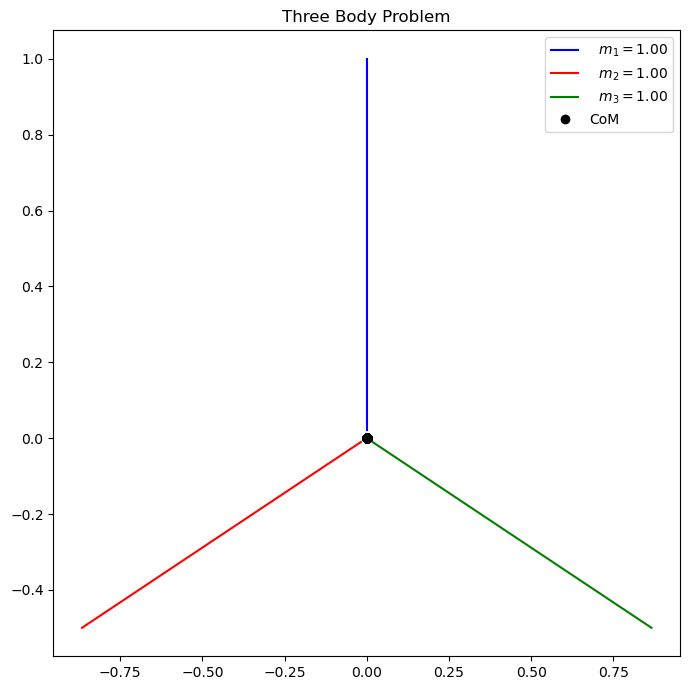

In [5]:
m_1 = 1
m_2 = 1
m_3 = 1
t_start = 0.
t_end = 100.
delta_t = 0.01
t_pts = np.arange(t_start, t_end+delta_t, delta_t)

# Initializing our system with a stationary CoM forming an equidistant triangle
threebody1 = GravityOrbits(G=1,m_1=m_1,m_2=m_2,m_3=m_3)
x10 = 0
x1dot0 = 0
y10 = 1
y1dot0 = 0
x20 = -np.sin(np.pi/3)
x2dot0 = 0
y20 = -np.cos(np.pi/3)
y2dot0 = 0
x30 = np.sin(np.pi/3)
x3dot0 = 0
y30 = -np.cos(np.pi/3)
y3dot0 = 0

z = [x10, x1dot0, y10, y1dot0, x20, x2dot0, y20, y2dot0, x30, x3dot0, y30, y3dot0]

x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot = threebody1.solve_ode(t_pts, z)

#Plotting our data
orbit_labels = (r'$x$',r'$y$')

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(1,1,1)
ax.plot(x1,y1, color='blue', label=rf'  $m_1 = {m_1:.2f}$')
ax.plot(x2,y2, color='red', label=rf'  $m_2 = {m_2:.2f}$')
ax.plot(x3,y3, color='green', label=rf'  $m_3 = {m_3:.2f}$')
ax.plot(comcalc(x1,x2,x3,m_1,m_2,m_3),comcalc(y1,y2,y3,m_1,m_2,m_3),'o', color='black', label='CoM')
ax.set_title('Three Body Problem')
ax.legend()
fig.tight_layout()

This is a test run to make sure the stimulation is working correctly. With three equidistant equal masses, we expect them to go towards the center of mass in a straight line. This seems like what is going on, but it's more apparent in the animation.

In [6]:
%%capture

x_min = -3
x_max = 3
y_min = -3
y_max = 3

#Setting up the animation figure
fig_anim = plt.figure(figsize=(5,5))
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min,x_max)
ax_anim.set_ylim(y_min,y_max)

ptcm_anim, = ax_anim.plot(comcalc(x1,x2,x3,m_1,m_2,m_3),comcalc(y1,y2,y3,m_1,m_2,m_3),'o', color='black')
pt1_anim, = ax_anim.plot(x1[0],y1[0],'o', color='blue')
pt2_anim, = ax_anim.plot(x2[0],y2[0],'o', color='red')
pt3_anim, = ax_anim.plot(x3[0],y3[0],'o', color='green')
ln1_anim, = ax_anim.plot(x1[0],y1[0], color='blue')
ln2_anim, = ax_anim.plot(x2[0],y2[0], color='red')
ln3_anim, = ax_anim.plot(x3[0],y3[0], color='green')

fig_anim.tight_layout()

In [7]:
x1data = []
x2data = []
x3data = []
y1data = []
y2data = []
y3data = []
anim = animation.FuncAnimation(fig_anim,
                               orbit_animation,
                               init_func=None,
                               frames=147,
                               interval=10,
                               blit=True,
                               repeat=False)

HTML(anim.to_jshtml())

As expected, our three masses simply move towards each other in a straight line.

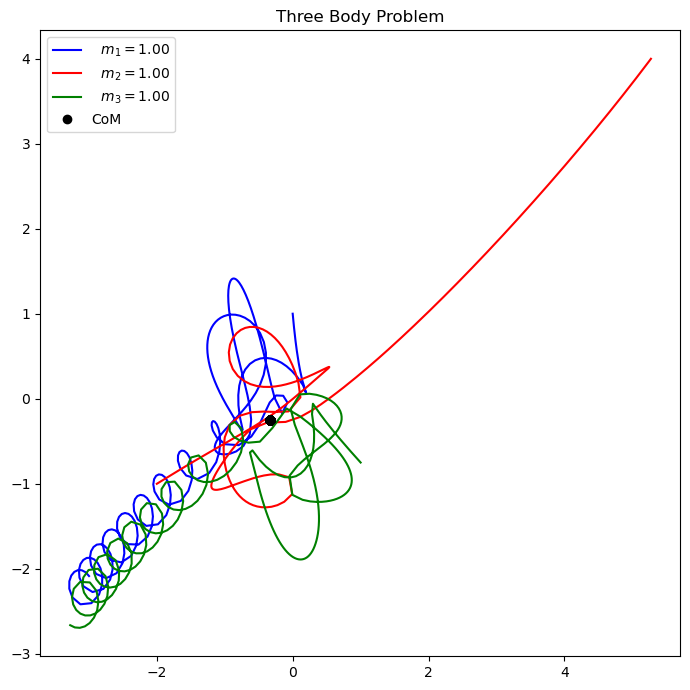

In [8]:
m_1 = 1
m_2 = 1
m_3 = 1
t_start = 0.
t_end = 30.
delta_t = 0.1
t_pts = np.arange(t_start, t_end+delta_t, delta_t)

# Initializing our system with a stationary CoM forming an equilateral triangle
threebody1 = GravityOrbits(G=1,m_1=m_1,m_2=m_2,m_3=m_3)
x10 = 0
x1dot0 = 0
y10 = 1
y1dot0 = 0
x20 = -2
x2dot0 = 0
y20 = -1
y2dot0 = 0
x30 = 1
x3dot0 = 0
y30 = -0.75
y3dot0 = 0

z = [x10, x1dot0, y10, y1dot0, x20, x2dot0, y20, y2dot0, x30, x3dot0, y30, y3dot0]

x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot = threebody1.solve_ode(t_pts, z)

#Plotting our data
orbit_labels = (r'$x$',r'$y$')

fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(1,1,1)
ax.plot(x1,y1, color='blue', label=rf'  $m_1 = {m_1:.2f}$')
ax.plot(x2,y2, color='red', label=rf'  $m_2 = {m_2:.2f}$')
ax.plot(x3,y3, color='green', label=rf'  $m_3 = {m_3:.2f}$')
ax.plot(comcalc(x1,x2,x3,m_1,m_2,m_3),comcalc(y1,y2,y3,m_1,m_2,m_3),'o', color='black', label='CoM')
ax.set_title('Three Body Problem')
ax.legend()
fig.tight_layout()

We now have three equal masses initially at rest and positioned in a scalene triangle. The plot above is rather chaotic and it can be hard to discern the motion. The motion is much easier to see in the animation. But from this plot, we can see that the center of mass does not move, which makes sense since all of our masses are initially at rest.

In [9]:
%%capture

x_min = -3
x_max = 3
y_min = -3
y_max = 3

#Setting up the animation figure
fig_anim = plt.figure(figsize=(5,5))
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min,x_max)
ax_anim.set_ylim(y_min,y_max)

ptcm_anim, = ax_anim.plot(comcalc(x1,x2,x3,m_1,m_2,m_3),comcalc(y1,y2,y3,m_1,m_2,m_3),'o', color='black')
pt1_anim, = ax_anim.plot(x1[0],y1[0],'o', color='blue')
pt2_anim, = ax_anim.plot(x2[0],y2[0],'o', color='red')
pt3_anim, = ax_anim.plot(x3[0],y3[0],'o', color='green')
ln1_anim, = ax_anim.plot(x1,y1, color='blue')
ln2_anim, = ax_anim.plot(x2,y2, color='red')
ln3_anim, = ax_anim.plot(x3,y3, color='green')

fig_anim.tight_layout()

In [10]:
x1data = []
x2data = []
x3data = []
y1data = []
y2data = []
y3data = []
anim = animation.FuncAnimation(fig_anim,
                               orbit_animation,
                               init_func=None,
                               frames=300,
                               interval=20,
                               blit=True,
                               repeat=False)
HTML(anim.to_jshtml())

The motion of our masses is now a lot more apparent. Our center of mass is still stationary since all of our masses started at rest. The motion is really interesting. As the blue and green mass move off together, the red mass has to move in the opposite direction at twice the speed in the CM frame so that the center of mass stays stationary.